# Custom OCR - text recognition

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [5]:
import sys
sys.path.append('../functions')
from matplotlib import pyplot as plt
import ad_functions as adfns


import numpy as np
import cv2
from tensorflow.keras.models import load_model
from imutils.contours import sort_contours
import imutils
from matplotlib import pyplot as plt
from icecream import ic

In [3]:
def mask_red(img):

    img_hsv=cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # lower mask (0-10)
    lower_red = np.array([0,50,50])
    upper_red = np.array([40,255,255])
    mask0 = cv2.inRange(img_hsv, lower_red, upper_red)

    # upper mask (170-180)
    lower_red = np.array([170,50,50])
    upper_red = np.array([180,255,255])
    mask1 = cv2.inRange(img_hsv, lower_red, upper_red)

    # join my masks
    mask = mask0+mask1

    # set my output img to zero everywhere except my mask
    output_img = img.copy()
    output_img[np.where(mask==0)] = 0

    # or your HSV image, which I *believe* is what you want
    output_hsv = img_hsv.copy()
    output_hsv[np.where(mask==0)] = 0

    return output_img


In [6]:
network = load_model("network")
network.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 13, 13, 32)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 6, 6, 64)         0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 2, 2, 128)       

# Loading the test image

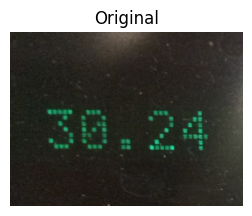

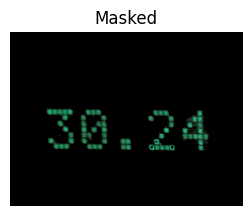

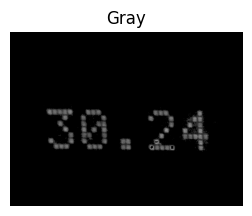

In [9]:

img = cv2.imread(r'sipaimages\8\5.jpg')
adfns.show_img(img, 3, "Original")

img2 = adfns.mask_green(img)
adfns.show_img(img2, 3, "Masked")

gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
adfns.show_img(gray, 3, "Gray")


# Pre-processing the image

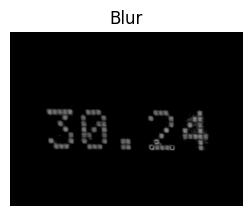

In [10]:
# improve the quality and remove some noise - use blur
blur = cv2.GaussianBlur(gray, (3,3), 0)
adfns.show_img(blur, 3, "Blur")


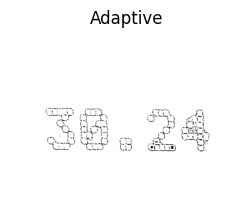

In [11]:
# use adaptive threshold to find different threshold values as there are varying states of colour
# use THRESH_BINARY as we onlu want black and white colours
adaptive = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
adfns.show_img(adaptive, 3, "Adaptive")


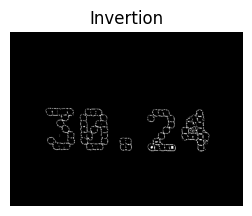

In [12]:
invertion = 255 - adaptive
adfns.show_img(invertion, 3, "Invertion")


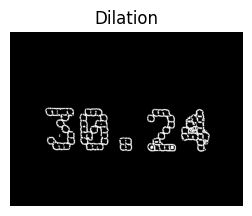

In [13]:
# The quality above could be better - can improve with dilation
# (3,3) is the matrix multiplication - can use different values here
dilation = cv2.dilate(invertion, np.ones((3,3)))
adfns.show_img(dilation, 3, "Dilation")


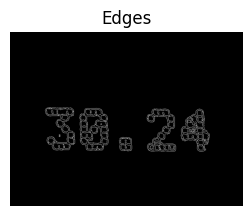

In [14]:
# Detection of the edges in the image - 

edges = cv2.Canny(dilation, 40, 150)
adfns.show_img(edges, 3, "Edges")



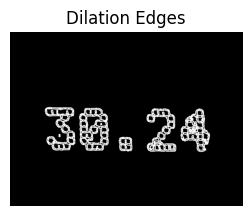

In [15]:
dilation = cv2.dilate(edges, np.ones((3,3)))
adfns.show_img(dilation, 3, "Dilation Edges")



# Contour detection

By detecting the coutours of the image, it will be possible to sepereate the characters and digits within the text of the image so that each can be sent to the neural network for identification.

In [16]:

# Function to find the coutours of an image
def find_contours(img):

  # OpenCV has a special function for finding the contours of with image - e.g. in a 0 there are two contours - internal and external
  # RETR_EXTERNAL will return the external coutours of within the image
  # CHAIN_APPROX_SIMPLE will extract basic image
  conts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  
  # Collect the contours using the function above
  conts = imutils.grab_contours(conts)

  # Sort the contours
  conts = sort_contours(conts, method = 'left-to-right')[0]

  # return the contours
  return conts

In [17]:
conts = find_contours(dilation.copy())


In [18]:
len(conts)

6

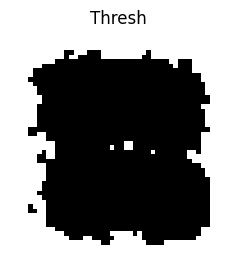

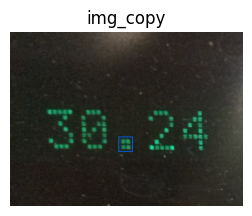

In [20]:
min_w, max_w = 4, 160
min_h, max_h = 14, 140
img_copy = img.copy()
for c in conts:
  #print(c)
  (x, y, w, h) = cv2.boundingRect(c)
  # print(x, y, w, h)

  # roi = gray[y:y+h, x:x+w]
  # show_img(roi)
    # thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
  
  # Check to see if the image is within the min and max boundarys
  if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    roi = gray[y:y+h, x:x+w]
    # show_img(roi)
    thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
    adfns.show_img(thresh, 3, "Thresh")
    cv2.rectangle(img_copy, (x, y), (x + w, y + h), (255, 100, 0), 2)

adfns.show_img(img_copy,3, "img_copy")

# Processing the detected characters

## ROI extraction


In [42]:
def extract_roi(img):
  roi = img[y:y + h, x:x + w]
  return roi

## Thresholding

In [43]:
def thresholding(img):
  thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
  return thresh

## Resizing

In [46]:
def resize_img(img, w, h):
  if w > h:
    # imutils resize function keeps the proportion of the image
    resized = imutils.resize(img, width = 28)
  else:
    resized = imutils.resize(img, height = 28)

  (h, w) = resized.shape

  # These values will be used to apply padding to the image and position the digit in the centre of the image
  dX = int(max(0, 28 - w) / 2.0)
  dY = int(max(0, 28 - h) / 2.0)

  # Used to make the border of the image using the calculated proportions
  filled = cv2.copyMakeBorder(resized, top=dY, bottom=dY, right=dX, left=dX, borderType=cv2.BORDER_CONSTANT, value = (0,0,0))

  #  resize the image
  filled = cv2.resize(filled, (28,28))
  return filled

273 115 22 34


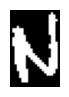

34 22


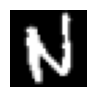

(28, 28)


In [52]:
(x, y, w, h) = cv2.boundingRect(conts[8])
print(x, y, w, h)
test_img = thresholding(gray[y:y+h, x:x+w])
show_img(test_img, 1)
(h, w) = test_img.shape
print(h, w)
test_img2 = resize_img(test_img, w, h)
show_img(test_img2, 1)
print(test_img2.shape)

## Normalization

In [53]:
def normalization(img):
  img = img.astype('float32') / 255.0
  img = np.expand_dims(img, axis = -1)
  return img

In [54]:
test_img2.shape, normalization(test_img2).shape

((28, 28), (28, 28, 1))

## Processing the detections

In [69]:
characters = []

In [59]:
# This function joins all the functions created up above
# The parameters received are the gray image and data about the bounding boxes
def process_box(gray, x, y, w, h):
  roi = extract_roi(gray)
  thresh = thresholding(roi)
  (h, w) = thresh.shape
  resized = resize_img(thresh, w, h)
  show_img(resized, .5)
  normalized = normalization(resized)
  characters.append((normalized, (x, y, w, h)))

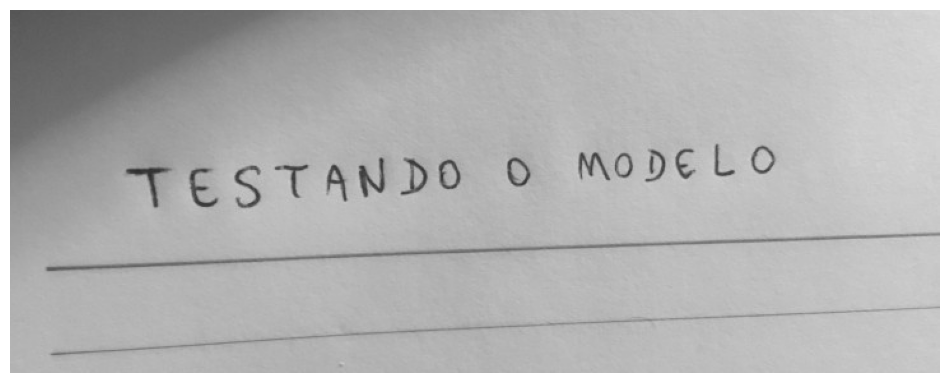

In [61]:
show_img(gray)

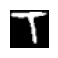

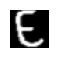

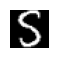

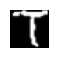

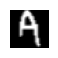

...

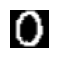

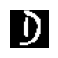

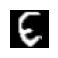

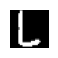

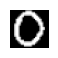

In [70]:
for c in conts:
  #print(c)
  (x, y, w, h) = cv2.boundingRect(c)
  if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    process_box(gray, x, y, w, h)

In [71]:
len(characters)

15

In [72]:
characters[0]

(array([[[0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ]],
 
        [[0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
         [0.        ],
        

In [80]:
# Get all the pixel data for each character in the characters array
pixels = np.array([pixel[0] for pixel in characters], dtype = 'float32')

# Get all the bounding boxes for each character in the characters array
boxes = [box[1] for box in characters]



In [81]:
boxes

[(90, 124, 38, 33),
 (140, 124, 24, 32),
 (175, 122, 23, 35),
 (206, 121, 29, 28),
 (247, 121, 19, 31),
 (273, 115, 22, 34),
 (305, 115, 24, 32),
 (336, 117, 19, 25),
 (389, 115, 21, 25),
 (445, 111, 27, 24),
 (474, 112, 16, 21),
 (497, 109, 18, 28),
 (521, 108, 18, 26),
 (552, 105, 18, 27),
 (581, 106, 21, 24)]

In [ ]:
len(pixels)

# Recognition of characters

In [83]:
digits = '0123456789'
letters = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
characters_list = digits + letters

# Convert into the format of a list
characters_list = [l for l in characters_list]

In [85]:
print(characters_list)

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


In [87]:

# The pixels are now in the format required for the neural network
pixels[0].shape, pixels.shape

((28, 28, 1), (15, 28, 28, 1))

In [88]:
# Now send this image to the neural network to get a prediction
predictions = network.predict(pixels)

1/1 [==============================] - 3s 3s/step


In [89]:
# here there are 15 characters in the image and the probabilities within each of the 36 options (0-9, A-Z)
predictions.shape

(15, 36)

T  ->  99.9923586845398


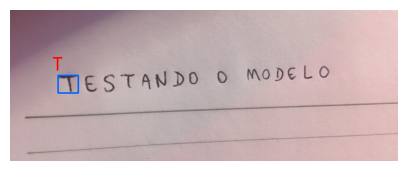

E  ->  99.98457431793213


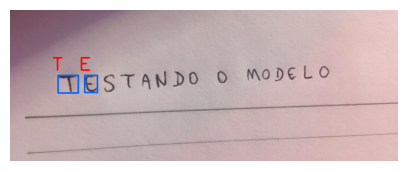

5  ->  58.22572112083435


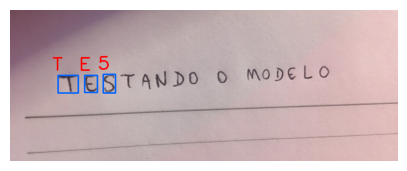

T  ->  99.81460571289062


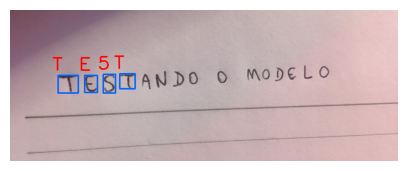

A  ->  100.0


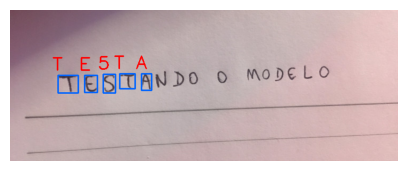

N  ->  99.99825954437256


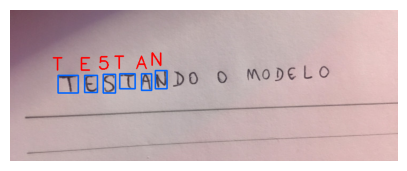

D  ->  99.99793767929077


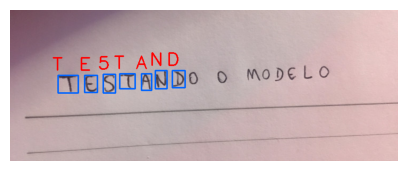

O  ->  69.43707466125488


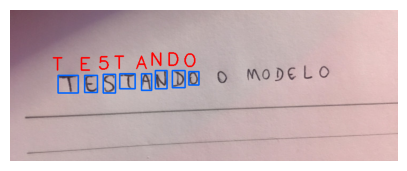

O  ->  76.63705945014954


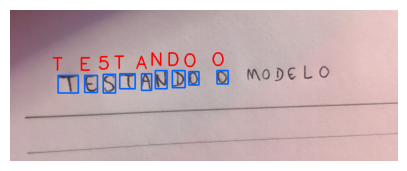

M  ->  99.99182224273682


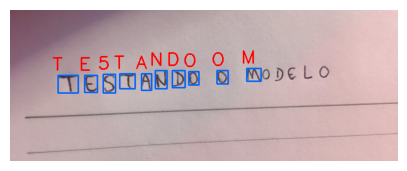

0  ->  58.993011713027954


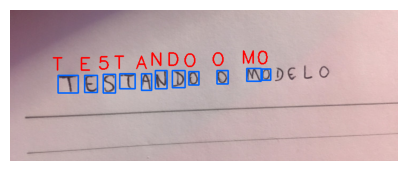

D  ->  99.95865225791931


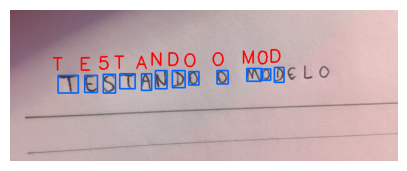

E  ->  98.64323735237122


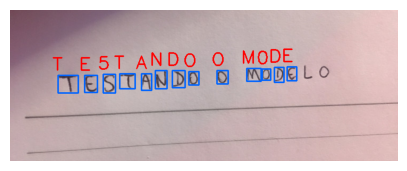

L  ->  99.99997615814209


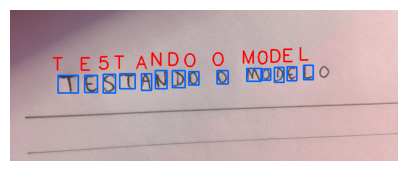

0  ->  64.56692814826965


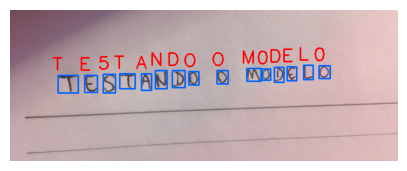

In [93]:
img_copy = img.copy()
for (prediction, (x, y, w, h)) in zip(predictions, boxes):

    # Collect the highest probability for the character/digit using argmax
    i = np.argmax(prediction)


    # Get the probability of each prediction
    probability = prediction[i]

    # Get the character associated with the probability
    character = characters_list[i]

    # Draw a rectangle in the image using the coordinates for each of the characters
    cv2.rectangle(img_copy, (x, y), (x + w, y + h), (255,100,0), 2)

    # Print the predicted character next to the bounding box
    cv2.putText(img_copy, character, (x - 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.1, (0,0,255), 2)

    # Display Results
    print(character, ' -> ', probability * 100)

    show_img(img_copy, 5)

## Further tests

In [100]:
# Same as the same function above apart from implementing a margin - increasing a margin increases the chances of getting good results
def extract_roi(img, margin=2):
  roi = img[y - margin:y + h, x - margin:x + w + margin]
  return roi

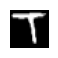

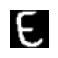

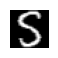

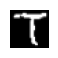

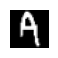

...

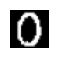

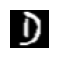

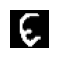

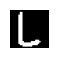

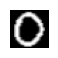

In [99]:
conts = find_contours(dilation.copy())
characters = []
for c in conts:
  (x, y, w, h) = cv2.boundingRect(c)
  if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    process_box(gray, x, y, w, h)

In [101]:
boxes = [b[1] for b in characters]
pixels = np.array([p[0] for p in characters], dtype='float32')
predictions = network.predict(pixels)

1/1 [==============================] - 0s 14ms/step


T  ->  99.99945163726807


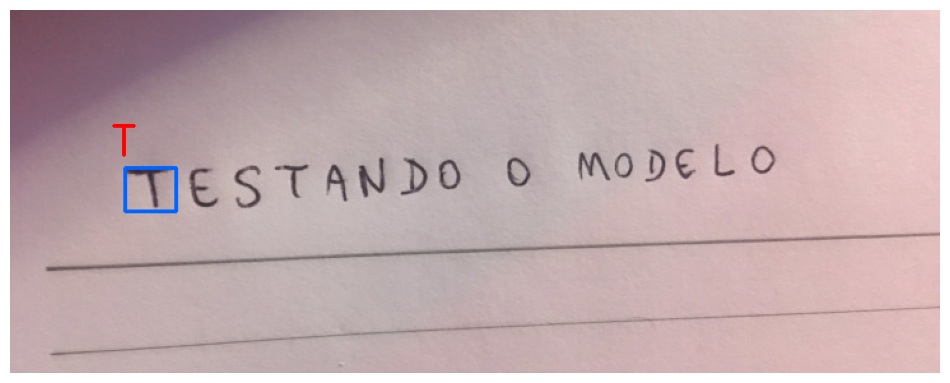

E  ->  99.93636012077332


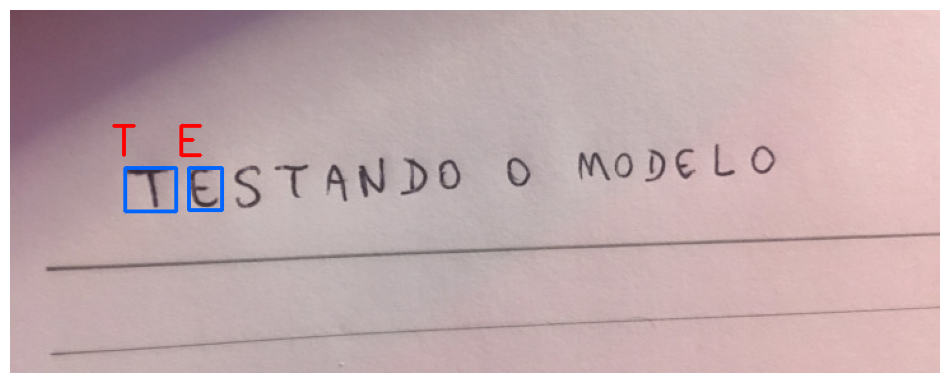

S  ->  98.23873043060303


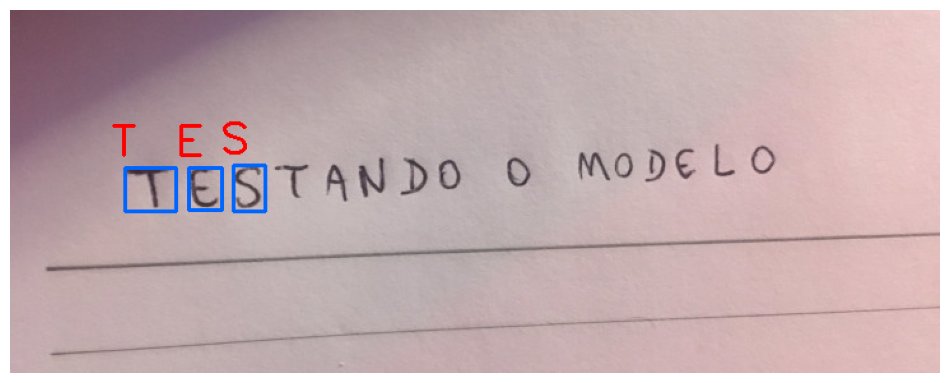

T  ->  99.95470643043518


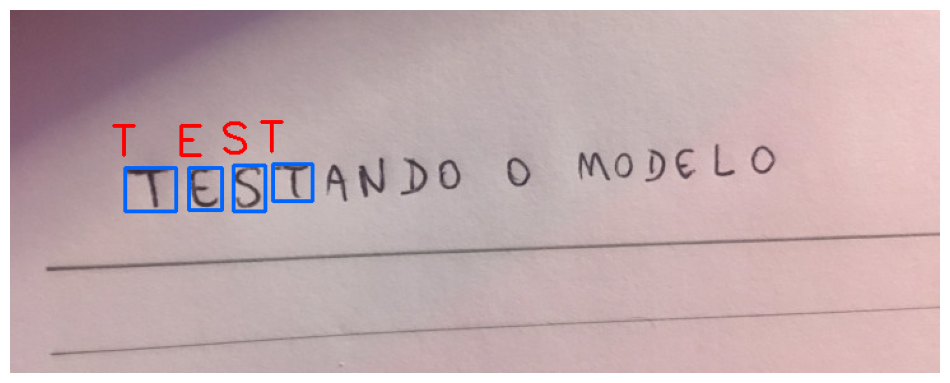

A  ->  99.99998807907104


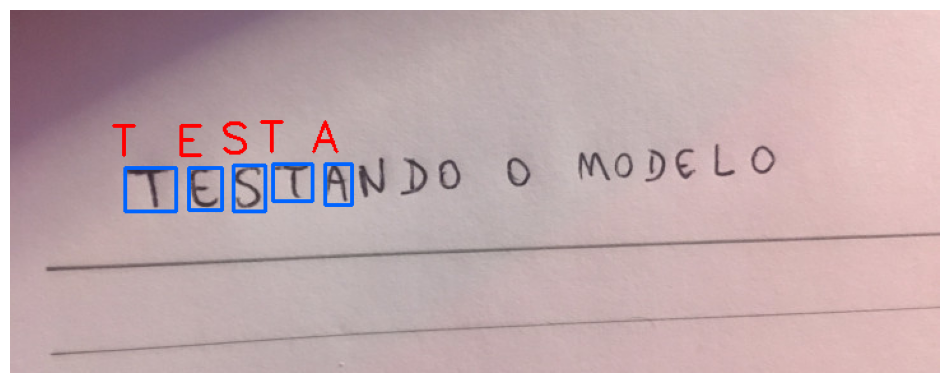

N  ->  99.99693632125854


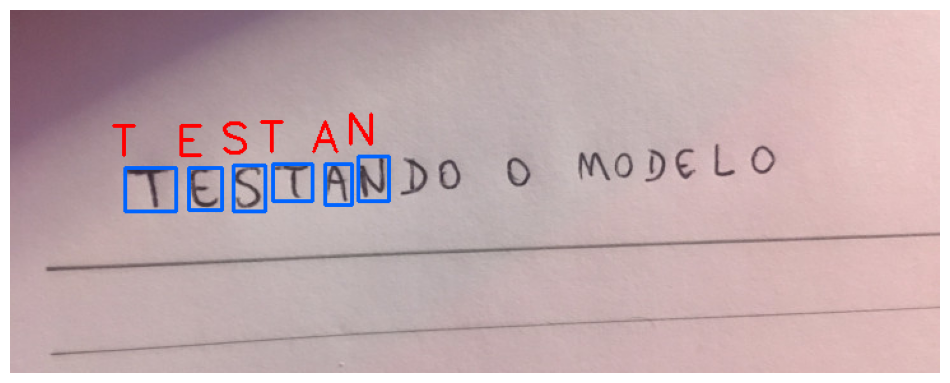

D  ->  99.99315738677979


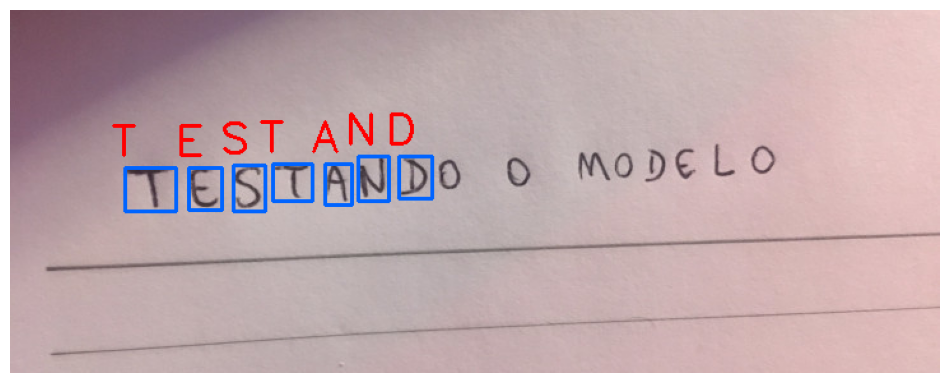

O  ->  55.94472885131836


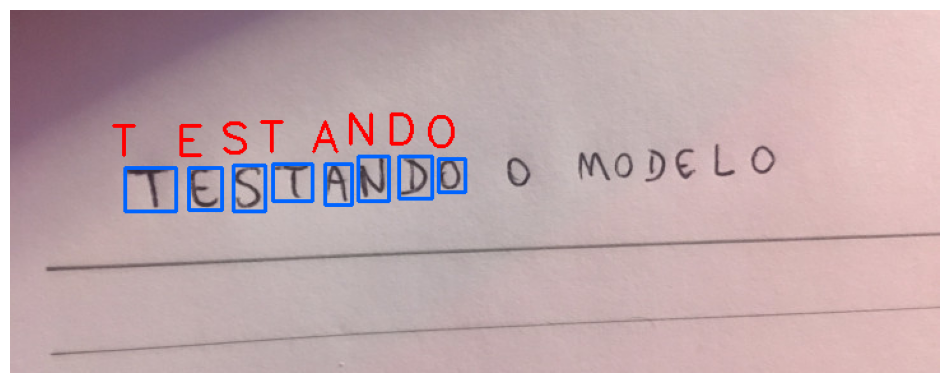

O  ->  80.72251081466675


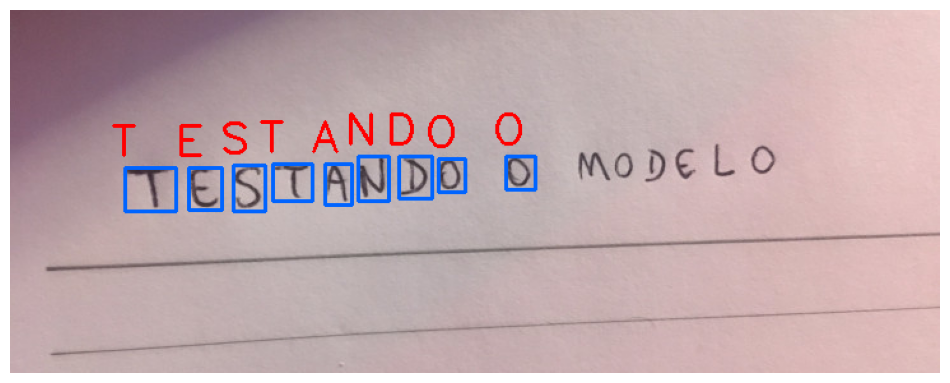

M  ->  99.99443292617798


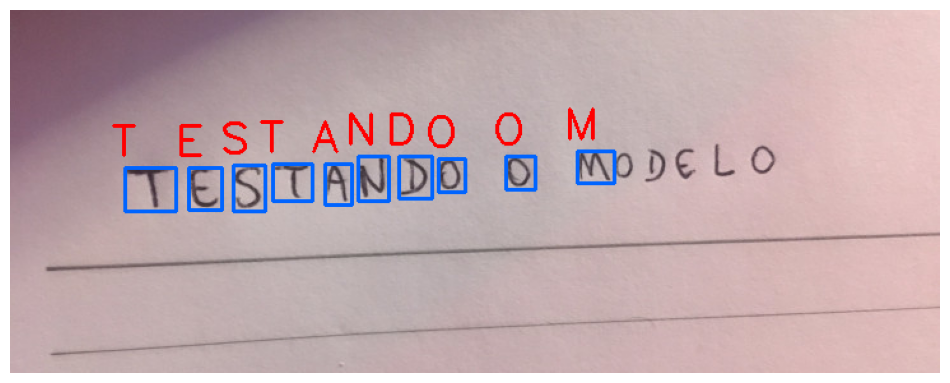

0  ->  96.81475162506104


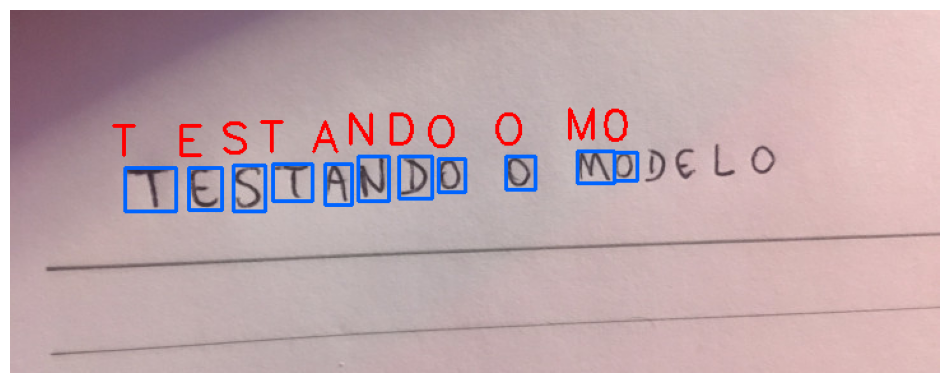

D  ->  99.96727705001831


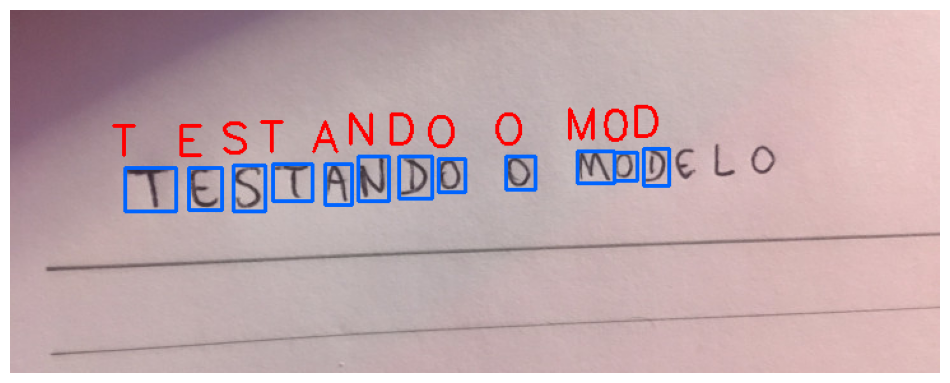

E  ->  98.8038718700409


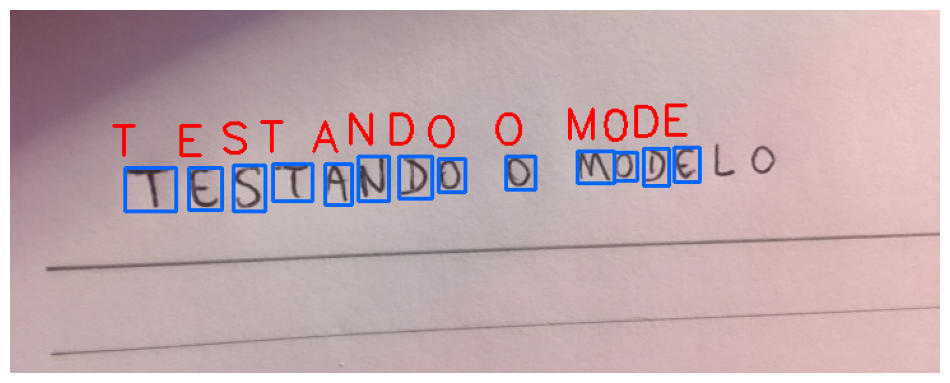

L  ->  99.99998807907104


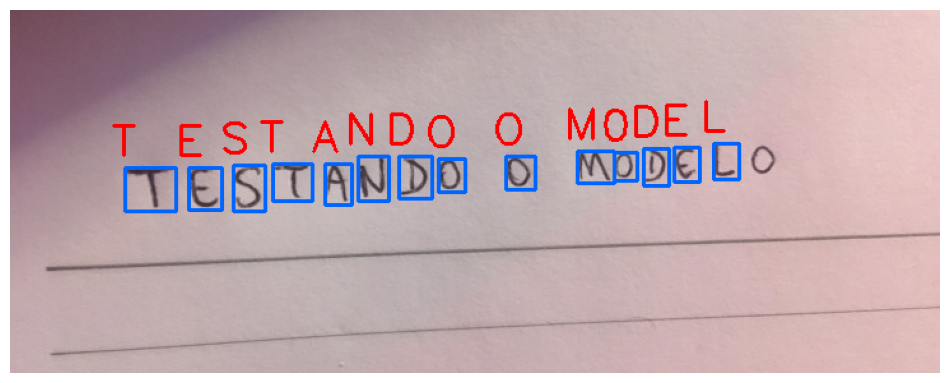

O  ->  69.45143938064575


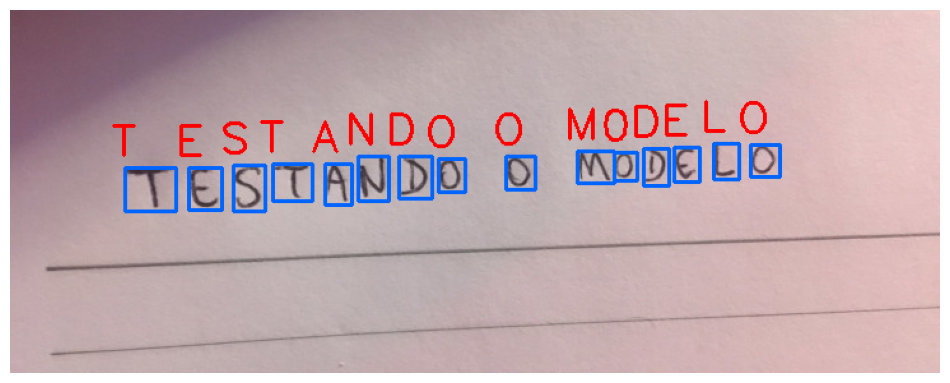

In [102]:
img_copy = img.copy()
for (prediction, (x, y, w, h)) in zip(predictions, boxes):
  i = np.argmax(prediction)
  probability = prediction[i]
  character = characters_list[i]
  
  cv2.rectangle(img_copy, (x, y), (x + w, y + h), (255,100,0), 2)
  cv2.putText(img_copy, character, (x - 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1.1, (0,0,255), 2)
  print(character, ' -> ', probability * 100)

  show_img(img_copy)

## Other Tests

In [103]:
def preprocess_img(img):
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray, (3, 3), 7)
  edges = cv2.Canny(blur, 40, 150)
  dilation = cv2.dilate(edges, np.ones((3,3)))  
  return gray, dilation

In [104]:
def prediction(predictions, characters_list):
  i = np.argmax(predictions)
  probability = predictions[i]
  character = characters_list[i]
  return i, probability, character

In [105]:
def draw_img(img_cp, character):
  cv2.rectangle(img_cp, (x, y), (x + w, y + h), (255, 100, 0), 2)
  cv2.putText(img_cp, character, (x - 10, y - 10),cv2.FONT_HERSHEY_SIMPLEX, 1.1, (0, 0, 255), 2)

## Problems with 0 and O, 1 an I, 5 and S

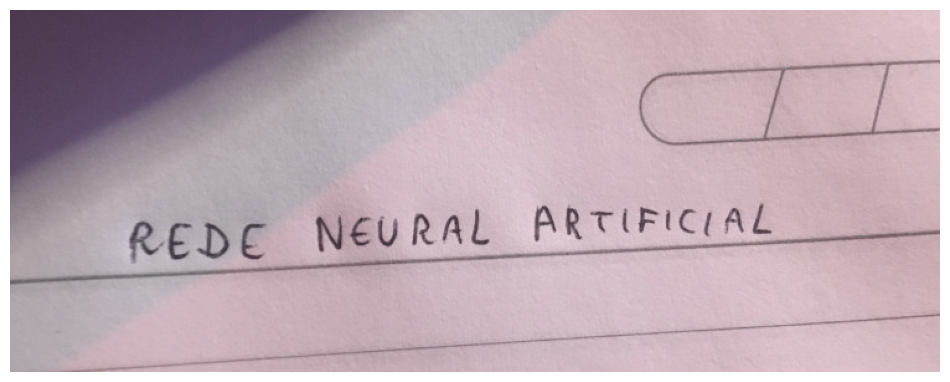

In [106]:
img = cv2.imread('./images/test_manuscript02.jpg')
show_img(img)

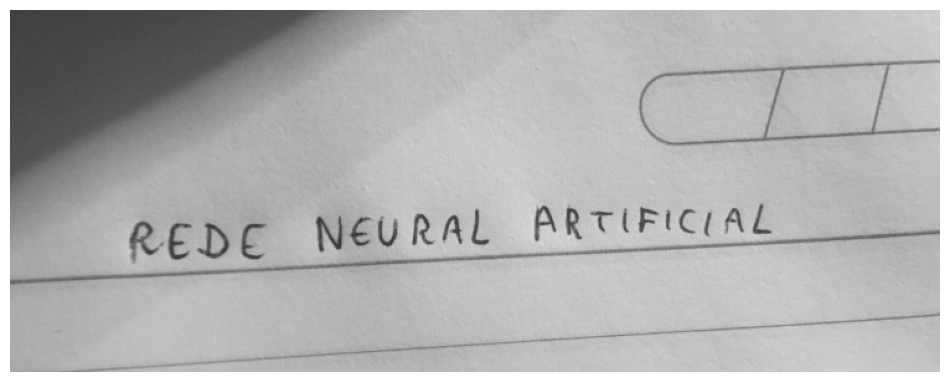

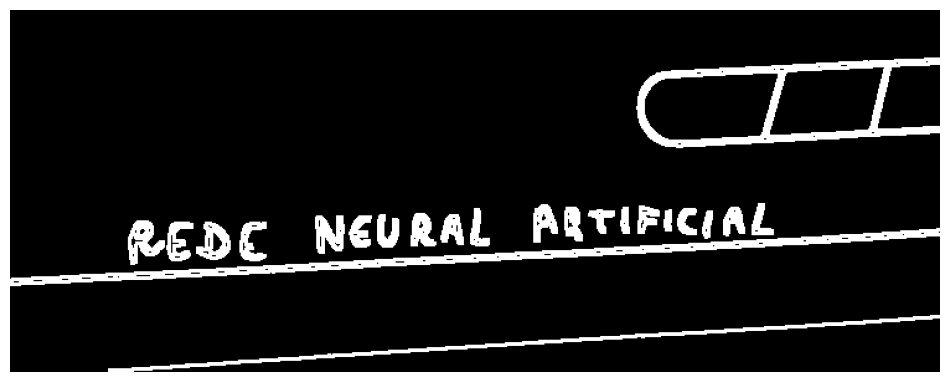

In [107]:
gray, processed_img = preprocess_img(img)
show_img(gray)
show_img(processed_img)

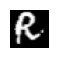

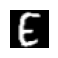

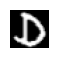

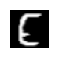

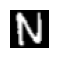

...

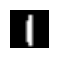

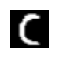

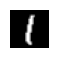

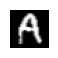

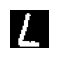

1/1 [==============================] - 0s 90ms/step


In [108]:
conts = find_contours(processed_img.copy())
characters = []
for c in conts:
  (x, y, w, h) = cv2.boundingRect(c)
  if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    process_box(gray, x, y, w, h)

boxes = [b[1] for b in characters]
pixels = np.array([p[0] for p in characters], dtype="float32")
predictions = network.predict(pixels)

## Comment

The list below was changed - 1 to I - rudamentry effort but can get over a hoop

You could also compare the characters in the neighbourhood - i.e. if a number is detected in a word - then it is likely a letter

In [110]:
digits_2 = 'OI234S6789'
letters_2 = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
characters_list_2 = digits_2 + letters_2
characters_list_2 = [l for l in characters_list_2]

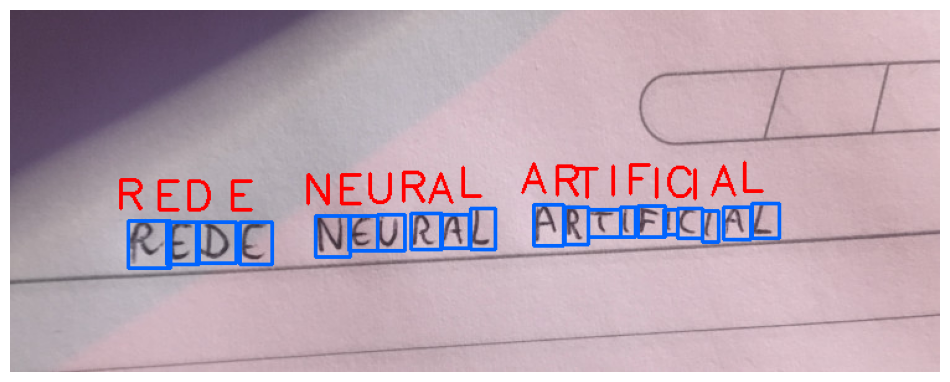

In [111]:
img_cp = img.copy()
for (pred, (x, y, w, h)) in zip(predictions, boxes):
  i, probability, character = prediction(pred, characters_list_2)
  draw_img(img_cp, character)
show_img(img_cp)

## Problems with undetected texts

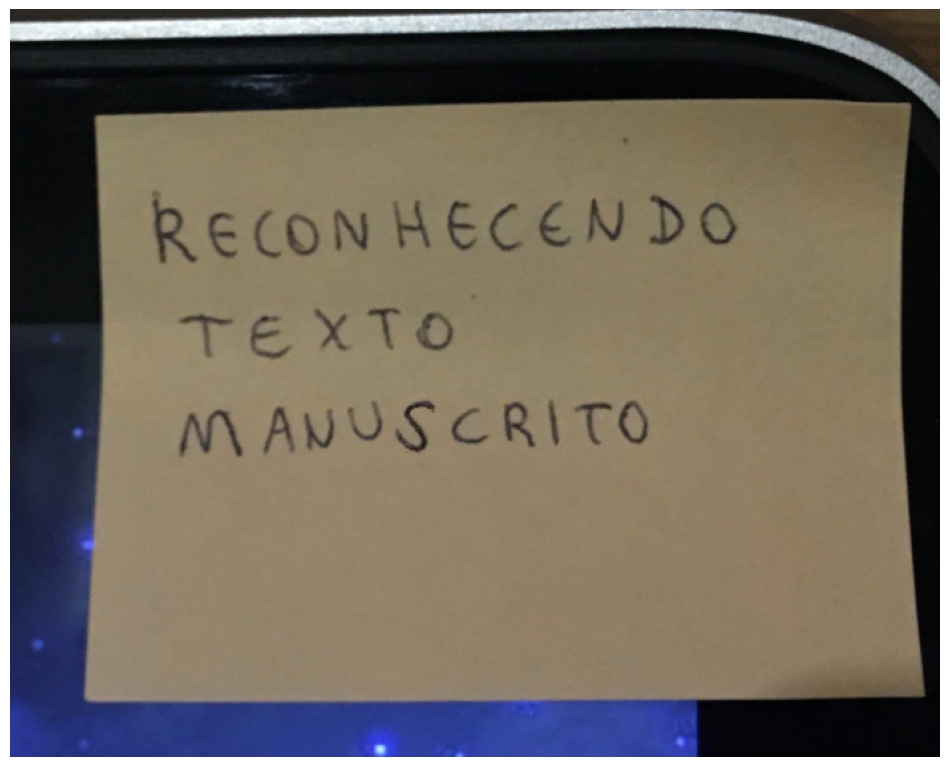

In [112]:
img = cv2.imread('./images/test_manuscript03.jpg')
show_img(img)

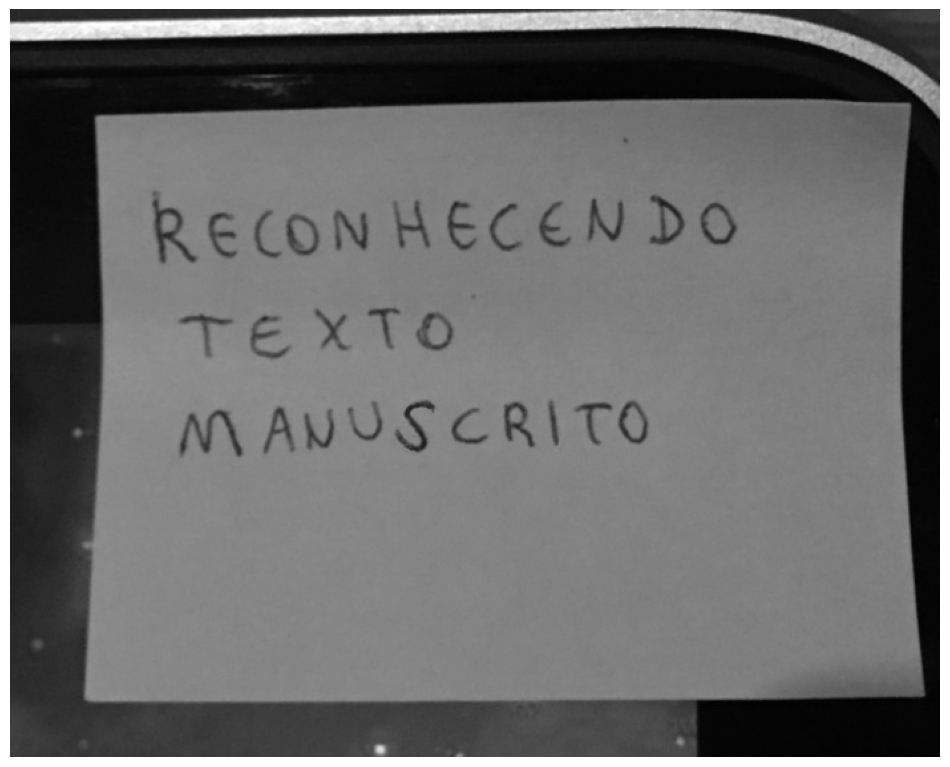

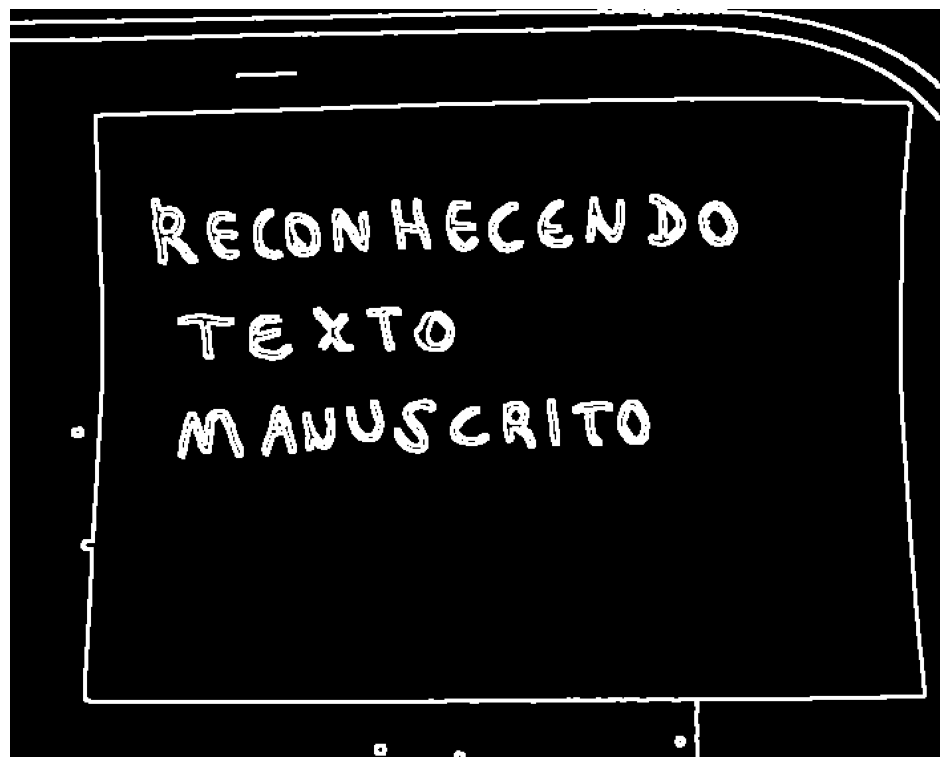

In [113]:
gray, processed_img = preprocess_img(img)
show_img(gray)
show_img(processed_img)

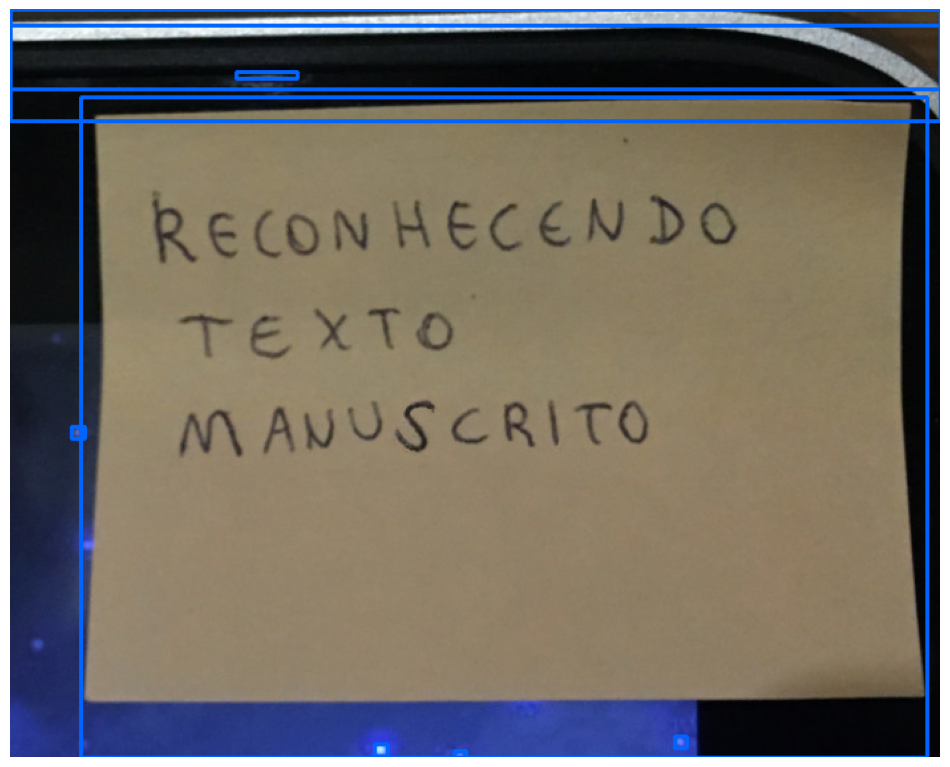

In [114]:
conts = find_contours(processed_img.copy()) # RETR_EXTERNAL
img_cp = img.copy()
for c in conts:
  (x, y, w, h) = cv2.boundingRect(c)
  #if (w >= l_min and w <= l_max) and (h >= a_min and h <= a_max):
  roi = gray[y:y + h, x:x + w]
  thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
  cv2.rectangle(img_cp, (x, y), (x + w, y + h), (255, 100, 0), 2)
show_img(img_cp)

## Comment

None of the letters above were located with the find_contours function - this was because the outer edges of the image was busy - this was because that function used RETR_EXTERNAL - this does not pickup the contours inside the letters and hence will not pick up the letters in the 



In [115]:
height, width = img.shape[:2]
print(height, width)

563 700


In [116]:

# Sort the coutours found by the contour area - the biggest will be at the beginning of the list.
# The idea is to get the least of the contours ordered by the contour size
contours_size = sorted(conts, key=cv2.contourArea, reverse=True)
print(contours_size)

[array([[[500,  66]],

       [[499,  67]],

       [[435,  67]],

       [[434,  68]],

       [[397,  68]],

       [[396,  69]],

       [[363,  69]],

       [[362,  70]],

       [[321,  70]],

       [[320,  71]],

       [[292,  71]],

       [[291,  72]],

       [[256,  72]],

       [[255,  73]],

       [[234,  73]],

       [[233,  74]],

       [[203,  74]],

       [[202,  75]],

       [[167,  75]],

       [[166,  76]],

       [[138,  76]],

       [[137,  77]],

       [[ 98,  77]],

       [[ 97,  78]],

       [[ 68,  78]],

       [[ 67,  79]],

       [[ 63,  79]],

       [[ 63, 101]],

       [[ 64, 102]],

       [[ 64, 122]],

       [[ 65, 123]],

       [[ 65, 156]],

       [[ 66, 157]],

       [[ 66, 184]],

       [[ 67, 185]],

       [[ 67, 208]],

       [[ 68, 209]],

       [[ 68, 287]],

       [[ 67, 288]],

       [[ 67, 304]],

       [[ 66, 305]],

       [[ 66, 322]],

       [[ 65, 323]],

       [[ 65, 338]],

       [[ 64, 339]],

       [[

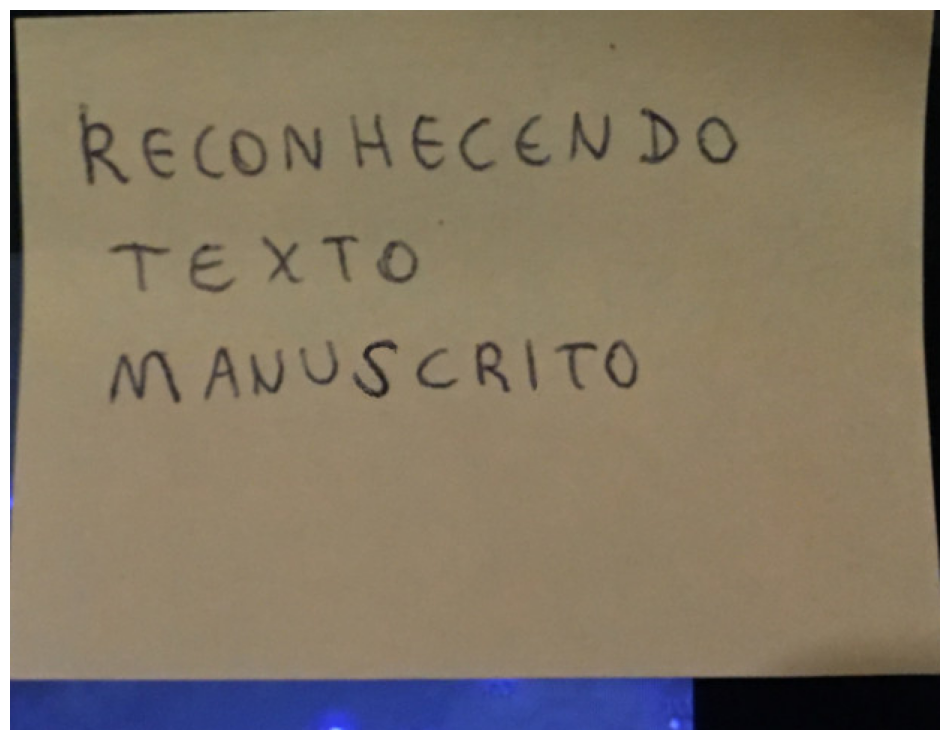

In [117]:
# Loop through the sorted contour list - and cut out the biggest contour - cropping the image
for c in contours_size:
  (x, y, w, h) = cv2.boundingRect(c)

  if (w >= (width / 2)) and (h >= height / 2):
    cut_off = 8
    cut_img = img[y+cut_off:y + h - cut_off, x+cut_off:x + w - cut_off]
    show_img(cut_img)

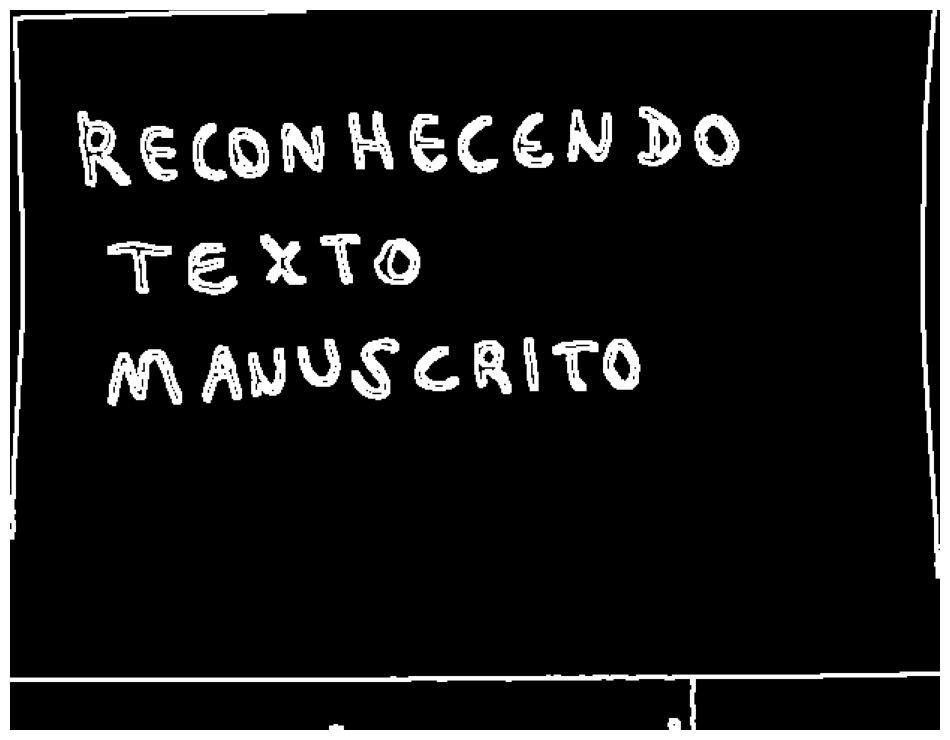

In [118]:
gray, processed_img = preprocess_img(cut_img)
show_img(processed_img)

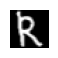

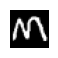

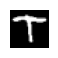

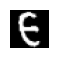

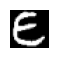

...

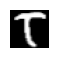

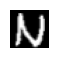

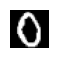

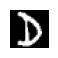

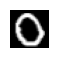

1/1 [==============================] - 0s 83ms/step


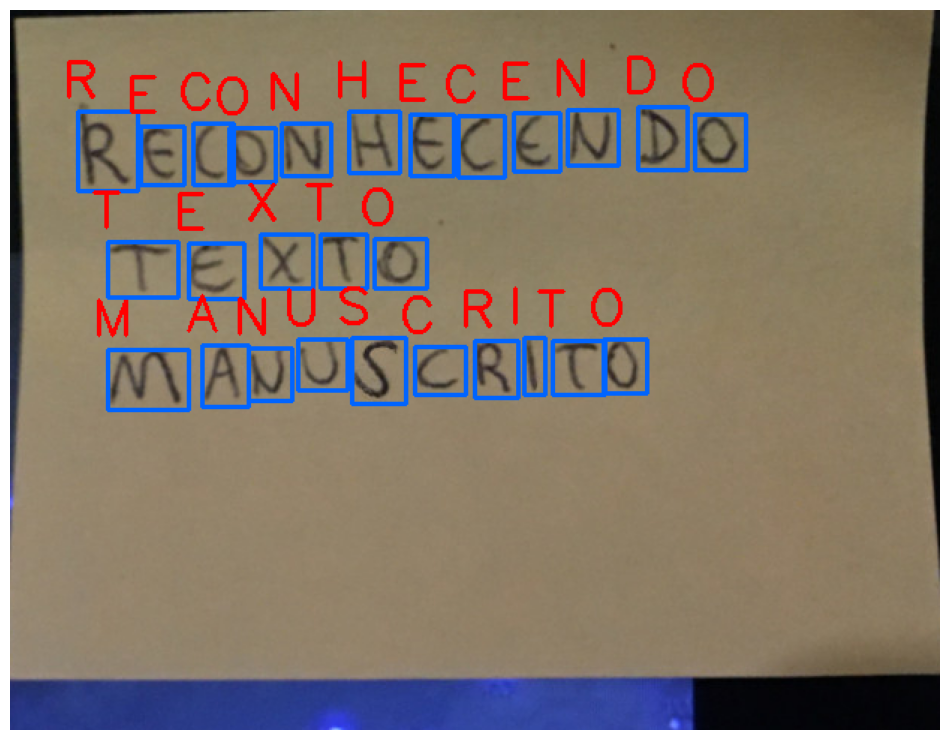

In [119]:
conts = find_contours(processed_img.copy())
characters = []
for c in conts:
  (x, y, w, h) = cv2.boundingRect(c)
  if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    process_box(gray, x, y, w, h)

boxes = [b[1] for b in characters]
pixels = np.array([p[0] for p in characters], dtype="float32")
predictions = network.predict(pixels)

img_cp = cut_img.copy()
for (pred, (x, y, w, h)) in zip(predictions, boxes):
  i, probability, character = prediction(pred, characters_list_2)
  draw_img(img_cp, character)
show_img(img_cp)